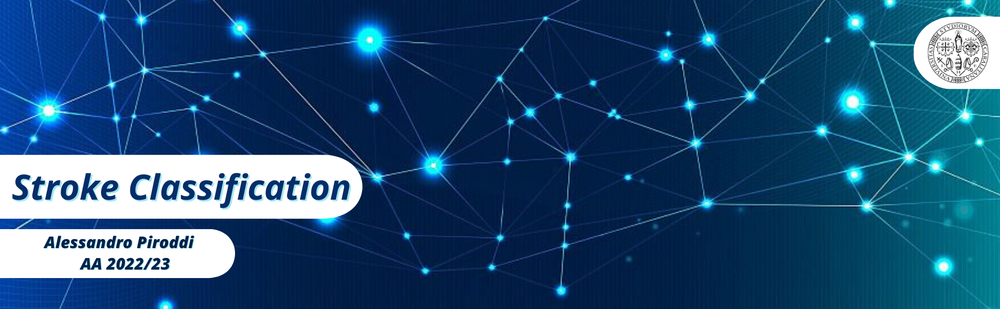

# <a id="Index"><b> Index </b>
>1. [**Loading Libraries and Files**](#1)
>2. [**Dataset Overview**](#2)
>3. [**Data Cleaning & Manipulation**](#3)
>4. [**Exploratory Data Analysis & Outlier Detection**](#4)
>5. [**Data Pre-processing**](#5)
>6. [**Classification Models**](#6)
>7. [**Variable selection (chisq) & class weight**](#7)
>8. [**Scikit-Learn**](#8)
>9. [**Close Spark Session**](#9)
    

# <a id="0"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 1 <span style='color:#5ce1e6'>•</span> Loading Libraries and Files </b></a>
[Back to the top](#Index) ↑

In [1]:
#Install dark theme
#!pip install jupyterthemes
#!jt -t onedork -T -kl

# Installing required Libraries (install only if loading librar modules aren't found)
# !pip install findspark
# !pip install numpy
# !pip install pandas
# !pip install matplotlib
# !pip install seaborn
# !pip install plotly
# !pip install scikit-learn
# !pip install xgboost
#!pip install pyarrow

import warnings
warnings.filterwarnings('ignore')

#Loading and data cleaning Libraries
import findspark
findspark.init()
from pyspark.sql import SparkSession
from pyspark.sql.functions import *
from pyspark.sql import functions as F
from pyspark.sql.types import *

#Data pre-processing Libraries
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml.feature import VectorAssembler, RobustScaler, MinMaxScaler, StandardScaler
from pyspark.ml.feature import ChiSqSelector
from pyspark.ml import Pipeline
from functools import reduce
from pyspark.sql import Row
from pyspark.sql import DataFrame
from pyspark.sql.window import *
from pyspark.sql.window import Window

# Classification Models Libraries
from pyspark.ml.evaluation import MulticlassClassificationEvaluator as MultiClassEvaluator
from pyspark.mllib.evaluation import BinaryClassificationMetrics, MulticlassMetrics
from pyspark.ml.classification import LogisticRegression
from pyspark.ml.classification import RandomForestClassifier
from pyspark.ml.classification import DecisionTreeClassifier
from pyspark.ml.classification import NaiveBayes
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.classification import LinearSVC
from pyspark.ml.tuning import CrossValidator, ParamGridBuilder


In [2]:
import os
import pandas as pd
import numpy as np
from numpy import mean, std
import random
from itertools import chain

#Visualization data libraries
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.metrics import classification_report,confusion_matrix


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">1.1 | Start Spark Session</div>


In [3]:
spark = SparkSession.builder.appName("Classification").getOrCreate()

In [4]:
sc = spark.sparkContext

In [5]:
sc._conf.getAll()

[('spark.rdd.compress', 'True'),
 ('spark.driver.host', '192.168.178.45'),
 ('spark.serializer.objectStreamReset', '100'),
 ('spark.master', 'local[*]'),
 ('spark.submit.pyFiles', ''),
 ('spark.executor.id', 'driver'),
 ('spark.submit.deployMode', 'client'),
 ('spark.app.startTime', '1683744549503'),
 ('spark.app.id', 'local-1683744550767'),
 ('spark.driver.port', '50877'),
 ('spark.app.name', 'Classification'),
 ('spark.ui.showConsoleProgress', 'true'),
 ('spark.sql.warehouse.dir', 'file:/C:/Users/cyler/spark-warehouse')]

In [6]:
sc

<SparkContext master=local[*] appName=Classification>

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">1.2 | Load CSV File</div>

In [7]:
dname = "healthcare-dataset-stroke-data.csv"
dpath = "C:\\Users\cyler\Desktop\DSBAI\Big_data"

In [8]:
df = spark.read.csv(os.path.join(dpath,dname), inferSchema=True, header=True)

# <a id="2"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 2 <span style='color:#5ce1e6'>•</span> Dataset Overview </b></a>

[Back to the top](#Index) ↑

In [9]:
df.columns

['id',
 'gender',
 'age',
 'hypertension',
 'heart_disease',
 'ever_married',
 'work_type',
 'Residence_type',
 'avg_glucose_level',
 'bmi',
 'smoking_status',
 'stroke']

In [10]:
df.show(10, truncate = False)

+-----+------+----+------------+-------------+------------+-------------+--------------+-----------------+----+---------------+------+
|id   |gender|age |hypertension|heart_disease|ever_married|work_type    |Residence_type|avg_glucose_level|bmi |smoking_status |stroke|
+-----+------+----+------------+-------------+------------+-------------+--------------+-----------------+----+---------------+------+
|9046 |Male  |67.0|0           |1            |Yes         |Private      |Urban         |228.69           |36.6|formerly smoked|1     |
|51676|Female|61.0|0           |0            |Yes         |Self-employed|Rural         |202.21           |N/A |never smoked   |1     |
|31112|Male  |80.0|0           |1            |Yes         |Private      |Rural         |105.92           |32.5|never smoked   |1     |
|60182|Female|49.0|0           |0            |Yes         |Private      |Urban         |171.23           |34.4|smokes         |1     |
|1665 |Female|79.0|1           |0            |Yes      

In [11]:
df.count()

5110

In [12]:
df.printSchema()

root
 |-- id: integer (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: double (nullable = true)
 |-- hypertension: integer (nullable = true)
 |-- heart_disease: integer (nullable = true)
 |-- ever_married: string (nullable = true)
 |-- work_type: string (nullable = true)
 |-- Residence_type: string (nullable = true)
 |-- avg_glucose_level: double (nullable = true)
 |-- bmi: string (nullable = true)
 |-- smoking_status: string (nullable = true)
 |-- stroke: integer (nullable = true)



In [13]:
df.select(df.columns[:4]).describe().show()
df.select(df.columns[4:8]).describe().show()
df.select(df.columns[8:]).describe().show()

+-------+-----------------+------+------------------+------------------+
|summary|               id|gender|               age|      hypertension|
+-------+-----------------+------+------------------+------------------+
|  count|             5110|  5110|              5110|              5110|
|   mean|36517.82935420744|  null|43.226614481409015|0.0974559686888454|
| stddev|21161.72162482715|  null| 22.61264672311348| 0.296606674233791|
|    min|               67|Female|              0.08|                 0|
|    max|            72940| Other|              82.0|                 1|
+-------+-----------------+------+------------------+------------------+

+-------+-------------------+------------+---------+--------------+
|summary|      heart_disease|ever_married|work_type|Residence_type|
+-------+-------------------+------------+---------+--------------+
|  count|               5110|        5110|     5110|          5110|
|   mean|0.05401174168297456|        null|     null|          null|
| 

# <a id="3"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 3 <span style='color:#5ce1e6'>•</span> Data Cleaning & Manipulation </b></a>

[Back to the top](#Index) ↑

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">3.1 | Rename Columns</div>

In [14]:
df = df\
 .withColumnRenamed("Residence_type", "residence_type")\
 .withColumnRenamed("avg_glucose_level", "avg_glucose_lvl")


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">3.2 | Casting</div>

In [15]:
df = df\
.withColumn("bmi", df["bmi"].cast(FloatType()))\
.withColumn("age", df["age"].cast(IntegerType()))\
.withColumn("avg_glucose_lvl", df["avg_glucose_lvl"].cast(FloatType()))

df.printSchema()


root
 |-- id: integer (nullable = true)
 |-- gender: string (nullable = true)
 |-- age: integer (nullable = true)
 |-- hypertension: integer (nullable = true)
 |-- heart_disease: integer (nullable = true)
 |-- ever_married: string (nullable = true)
 |-- work_type: string (nullable = true)
 |-- residence_type: string (nullable = true)
 |-- avg_glucose_lvl: float (nullable = true)
 |-- bmi: float (nullable = true)
 |-- smoking_status: string (nullable = true)
 |-- stroke: integer (nullable = true)



### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">3.3 | Handling NA, Duplicate and useless values</div>


In [16]:
df.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns])\
.show()

+---+------+---+------------+-------------+------------+---------+--------------+---------------+---+--------------+------+
| id|gender|age|hypertension|heart_disease|ever_married|work_type|residence_type|avg_glucose_lvl|bmi|smoking_status|stroke|
+---+------+---+------------+-------------+------------+---------+--------------+---------------+---+--------------+------+
|  0|     0|  0|           0|            0|           0|        0|             0|              0|201|             0|     0|
+---+------+---+------------+-------------+------------+---------+--------------+---------------+---+--------------+------+



In [17]:
df.select("bmi").summary("50%","mean")\
.show()

+-------+-----------------+
|summary|              bmi|
+-------+-----------------+
|    50%|             28.1|
|   mean|28.89323691268831|
+-------+-----------------+



In [18]:
df = df.na.fill({"bmi" : 28})

In [19]:
df.show()
df.count()

+-----+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
|   id|gender|age|hypertension|heart_disease|ever_married|    work_type|residence_type|avg_glucose_lvl| bmi| smoking_status|stroke|
+-----+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
| 9046|  Male| 67|           0|            1|         Yes|      Private|         Urban|         228.69|36.6|formerly smoked|     1|
|51676|Female| 61|           0|            0|         Yes|Self-employed|         Rural|         202.21|28.0|   never smoked|     1|
|31112|  Male| 80|           0|            1|         Yes|      Private|         Rural|         105.92|32.5|   never smoked|     1|
|60182|Female| 49|           0|            0|         Yes|      Private|         Urban|         171.23|34.4|         smokes|     1|
| 1665|Female| 79|           1|            0|         Yes|Self-employed|    

5110

In [20]:
df.groupBy("gender").count().sort('gender')\
.show()
# the column gender has 3 levels

+------+-----+
|gender|count|
+------+-----+
|Female| 2994|
|  Male| 2115|
| Other|    1|
+------+-----+



In [21]:
#Only one instance of gender "Other" is found. Removing it since it's not significative
cndt = ~((F.col('gender') == "Other"))
df = df.filter(cndt)
df.show()
df.count()

+-----+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
|   id|gender|age|hypertension|heart_disease|ever_married|    work_type|residence_type|avg_glucose_lvl| bmi| smoking_status|stroke|
+-----+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
| 9046|  Male| 67|           0|            1|         Yes|      Private|         Urban|         228.69|36.6|formerly smoked|     1|
|51676|Female| 61|           0|            0|         Yes|Self-employed|         Rural|         202.21|28.0|   never smoked|     1|
|31112|  Male| 80|           0|            1|         Yes|      Private|         Rural|         105.92|32.5|   never smoked|     1|
|60182|Female| 49|           0|            0|         Yes|      Private|         Urban|         171.23|34.4|         smokes|     1|
| 1665|Female| 79|           1|            0|         Yes|Self-employed|    

5109

In [22]:
# df.groupBy("age").count().sort('age')\
# .show()

In [23]:
# cndt1 = ~((F.col('age') <= 0))
# df = df.filter(cndt1)

In [24]:
tot = df.count()
df.groupBy("smoking_status") \
  .count() \
  .withColumnRenamed('count', 'cnt_per_group') \
  .withColumn('perc_of_count_total', (F.col('cnt_per_group') / tot) * 100 ) \
  .show()
#unknown level count for 30% of the dataset's observations. It can't be removed or managed

+---------------+-------------+-------------------+
| smoking_status|cnt_per_group|perc_of_count_total|
+---------------+-------------+-------------------+
|         smokes|          789| 15.443335290663535|
|        Unknown|         1544| 30.221178312781365|
|   never smoked|         1892| 37.032687414366805|
|formerly smoked|          884| 17.302798982188293|
+---------------+-------------+-------------------+



In [25]:
# cndt2 = ~((F.col('smoking_status') == "Unknown"))
# df = df.filter(cndt2)

In [26]:
#Deleting useless columns
df = df.drop("id")

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">3.4 | Rename Categorical Levels </div>

In [27]:
levels = [countDistinct(c).alias(c) for c in df.columns]
df.select(*levels).show()


+------+---+------------+-------------+------------+---------+--------------+---------------+---+--------------+------+
|gender|age|hypertension|heart_disease|ever_married|work_type|residence_type|avg_glucose_lvl|bmi|smoking_status|stroke|
+------+---+------------+-------------+------------+---------+--------------+---------------+---+--------------+------+
|     2| 83|           2|            2|           2|        5|             2|           3978|418|             4|     2|
+------+---+------------+-------------+------------+---------+--------------+---------------+---+--------------+------+



In [28]:
df1 = df\
.withColumn("hypertension", F.when(df.hypertension == 0, "No").otherwise("Yes"))\
.withColumn("heart_disease", F.when(df.heart_disease == 0, "No").otherwise("Yes"))\
.withColumn("stroke", F.when(df.stroke == 0, "No").otherwise("Yes"))

In [29]:
df1.show(5)
df1.printSchema()
print(f'Dataframe observations : {df1.count()}')

+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
|gender|age|hypertension|heart_disease|ever_married|    work_type|residence_type|avg_glucose_lvl| bmi| smoking_status|stroke|
+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
|  Male| 67|          No|          Yes|         Yes|      Private|         Urban|         228.69|36.6|formerly smoked|   Yes|
|Female| 61|          No|           No|         Yes|Self-employed|         Rural|         202.21|28.0|   never smoked|   Yes|
|  Male| 80|          No|          Yes|         Yes|      Private|         Rural|         105.92|32.5|   never smoked|   Yes|
|Female| 49|          No|           No|         Yes|      Private|         Urban|         171.23|34.4|         smokes|   Yes|
|Female| 79|         Yes|           No|         Yes|Self-employed|         Rural|         174.12|24.0|   never smoked|

# <a id="4"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 4 <span style='color:#5ce1e6'>•</span> Exploratory Data Analysis & Outliers Detection </b></a>

[Back to the top](#Index) ↑


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">4.1 | Correlation Matrix </div>

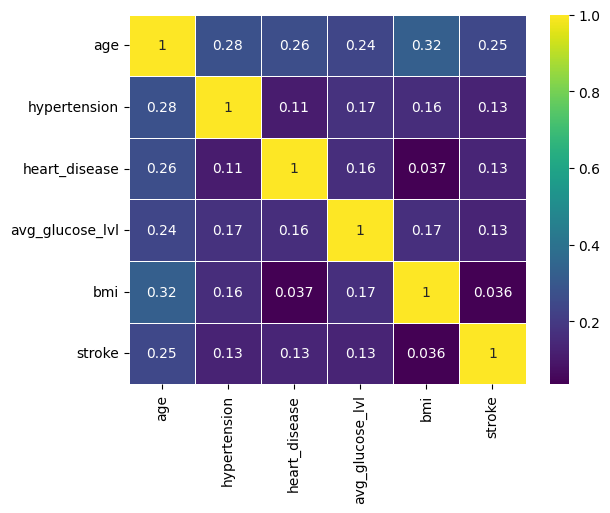

In [30]:
df_cor_matrix = df.toPandas()
corr = df_cor_matrix.corr()
sns.heatmap(corr, annot=True, linewidths=0.5, cmap='viridis')
plt.show()

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">4.2 | Univariate Graphs </div>

In [31]:
pd_df = df1.toPandas()

num_cols = ["age", "avg_glucose_lvl", "bmi"]

cat_cols = ["gender", "hypertension", "heart_disease",
            "ever_married", "work_type", "residence_type",
            "smoking_status"]

In [32]:
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 600

In [33]:
# Categorical univariate graphs

gender_count = pd_df.groupby(['gender']).size().reset_index().rename(columns={0: 'count'})
hypertension_count = pd_df.groupby(['hypertension']).size().reset_index().rename(columns={0: 'count'})
heart_disease_count = pd_df.groupby(['heart_disease']).size().reset_index().rename(columns={0: 'count'})
ever_married_count = pd_df.groupby(['ever_married']).size().reset_index().rename(columns={0: 'count'})
work_type_count = pd_df.groupby(['work_type']).size().reset_index().rename(columns={0: 'count'})
residence_type_count = pd_df.groupby(['residence_type']).size().reset_index().rename(columns={0: 'count'})
smoking_status_count = pd_df.groupby(['smoking_status']).size().reset_index().rename(columns={0: 'count'})
stroke_count = pd_df.groupby(['stroke']).size().reset_index().rename(columns={0: 'count'})

fig = make_subplots(rows=4, cols=2,
                    specs=[[{'type':'domain'}, {'type':'domain'}],
                           [{'type':'domain'}, {'type':'domain'}],
                           [{'type':'domain'}, {'type':'domain'}],
                           [{'type':'domain'}, {'type':'domain'}]
                          ])

## Gender Donut Chart
fig.add_trace(
    go.Pie(
        labels=gender_count['gender'],
        values=gender_count['count'],
        hole=.5,
        title='Gender',
        titlefont={'color':None, 'size': 24},       
        ),
    row=1,col=1
    )

## hypertension Donut Chart
fig.add_trace(
    go.Pie(
        labels=hypertension_count['hypertension'],
        values=hypertension_count['count'],
        hole=.5,
        title='Hypertension',
        titlefont={'color':None, 'size': 24},
        ),
    row=1,col=2
    )

## heart_disease Donut Chart
fig.add_trace(
    go.Pie(
        labels=heart_disease_count['heart_disease'],
        values=heart_disease_count['count'],
        hole=.5,
        title='Heart Disease',
        titlefont={'color':None, 'size': 24},
        ),
    row=2,col=1
    )


## ever_married Donut Chart
fig.add_trace(
    go.Pie(
        labels=ever_married_count['ever_married'],
        values=ever_married_count['count'],
        hole=.5,
        title='Ever Married',
        titlefont={'color':None, 'size': 24},
        ),
    row=2,col=2
    )

## work_type Donut Chart
fig.add_trace(
    go.Pie(
        labels=work_type_count['work_type'],
        values=work_type_count['count'],
        hole=.5,
        title='Work Type',
        titlefont={'color':None, 'size': 24},
        ),
    row=3,col=1
    )

## residence_type Donut Chart
fig.add_trace(
    go.Pie(
        labels=residence_type_count['residence_type'],
        values=residence_type_count['count'],
        hole=.5,
        title='Residence Type',
        titlefont={'color':None, 'size': 24},
        ),
    row=3,col=2
    )

## smoking_status Donut Chart
fig.add_trace(
    go.Pie(
        labels=smoking_status_count['smoking_status'],
        values=smoking_status_count['count'],
        hole=.5,
        title='Smoking Status',
        titlefont={'color':None, 'size': 24},
        ),
    row=4,col=1
    )

## stroke Donut Chart
fig.add_trace(
    go.Pie(
        labels=stroke_count['stroke'],
        values=stroke_count['count'],
        hole=.5,
        title='Stroke',
        titlefont={'color':None, 'size': 24},
        ),
    row=4,col=2
    )

fig.update_traces(
    hoverinfo='label+value',
    textinfo='label+percent',
    textfont_size=12,
    marker=dict(
#         colors=theme_colors,
        line=dict(color='#EEEEEE',
                  width=2)
        )
    )


fig.layout.update(title="<b> Univariate Graphs for Categorical Variables <b>",
                  titlefont={'color':None, 'size': 24, 'family': 'Trebuchet MS'},
                  showlegend=False, 
                  height=1200, 
                  width=1000,
                  template='seaborn',
                  title_x=0.5
                  )
fig.show()

In [34]:
# Quantitative univariate graphs

fig,ax=plt.subplots(3,2,figsize=(15,15))
for index,i in enumerate(num_cols):
    plt.suptitle("Distribution for quantitative variables",size=20)
    n=sns.histplot(pd_df[i],ax=ax[index,0],kde=True, color='#E10000')
    n.lines[0].set_color('#0d628c')
    sns.boxplot(data=pd_df,x=i,ax=ax[index,1])


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">4.3 | Bivariate Graphs </div>

In [35]:
# plots between categoical features and target

fig,ax = plt.subplots(3, 3,figsize=(20, 10))

for idx, feature in enumerate(cat_cols):
    row = idx//len(num_cols)
    col = idx% len(num_cols)
    sns.countplot(data=pd_df, 
                  x=feature, 
                  hue='stroke',
                  ax =ax[row,col],
                  palette=['#CB5555','#0d628c'])
    
plt.tight_layout() 

[Text(0.5, 1.0, 'Age Distribution and Stroke Distribution')]

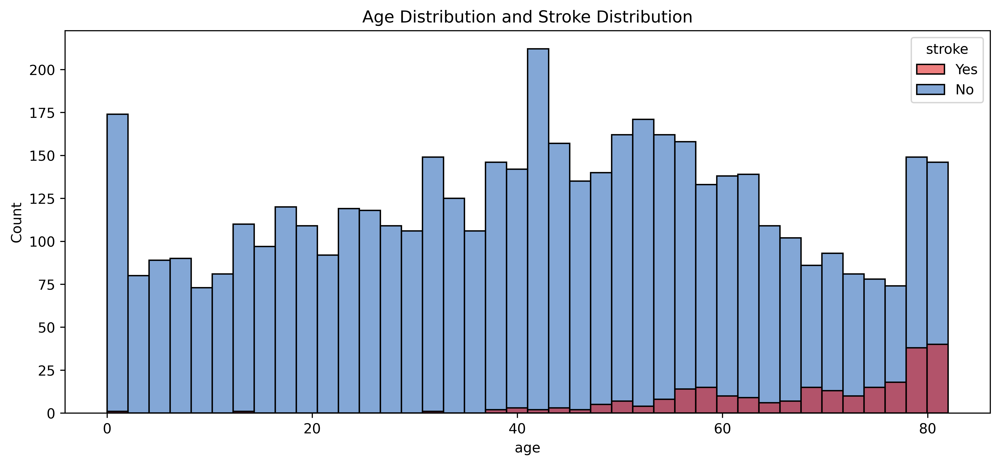

In [36]:
plt.figure(figsize=(12,5))
sns.histplot(x='age',
             data=pd_df, 
             hue='stroke',
             bins=40,
             palette=['#E10000','#0951AF'])\
.set(title='Age Distribution and Stroke Distribution')

[Text(0.5, 1.0, 'Bmi Distribution and Stroke Distribution')]

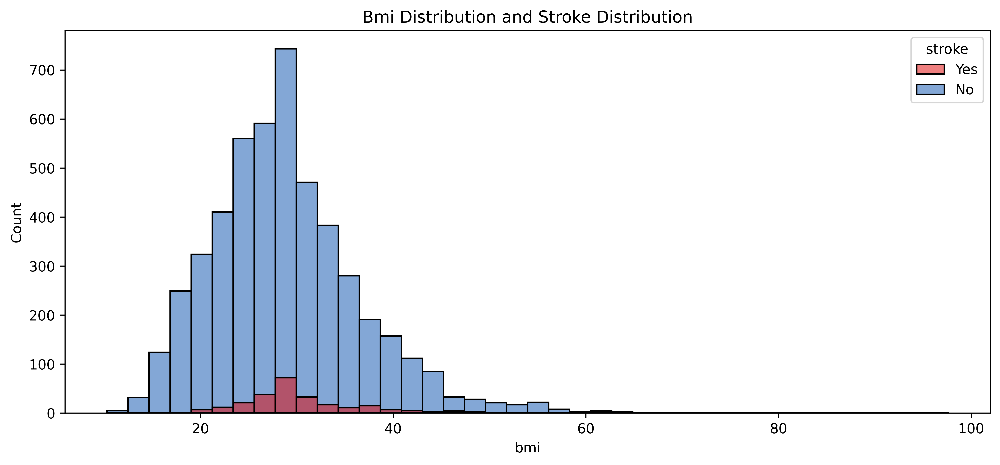

In [37]:
plt.figure(figsize=(12,5))
sns.histplot(x='bmi', 
             data=pd_df,
             hue='stroke',
             bins=40,
             palette=['#E10000','#0951AF'])\
.set(title='Bmi Distribution and Stroke Distribution')

[Text(0.5, 1.0, 'Average Glucose Level Distribution and Stroke Distribution')]

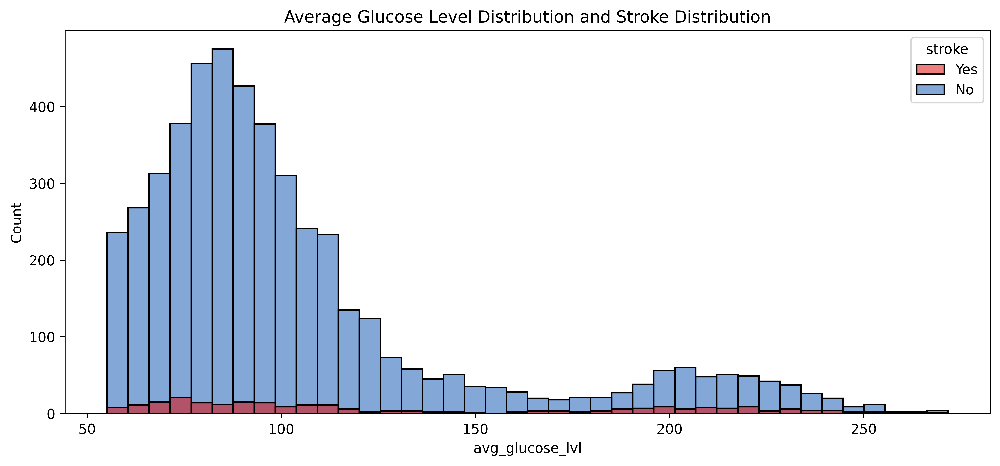

In [38]:
plt.figure(figsize=(12,5))
sns.histplot(x='avg_glucose_lvl', 
             data=pd_df,
             hue='stroke',
             bins=40,
             palette=['#E10000','#0951AF'])\
.set(title='Average Glucose Level Distribution and Stroke Distribution')

In [39]:
def boxplot_cate(num_cols) :
    
    fig , axs = plt.subplots(nrows=1 , ncols=len(cat_cols) , figsize=(20,5) , sharey=True )
    axs = axs.ravel()

    for index , col  in enumerate(cat_cols) : 
        sns.boxplot(data=pd_df , y=num_cols, x=col  , ax=axs[index])
        axs[index].tick_params('x' ,labelrotation=90)
        axs[index].set_title(col)
        axs[index].set_xlabel('')
        axs[index].set_ylabel(num_cols if index==0 else '')

    return plt.tight_layout()

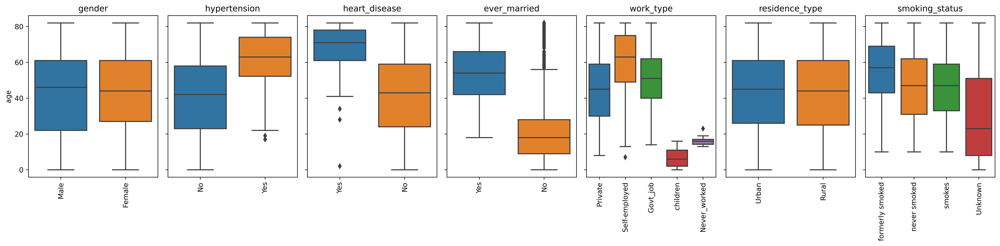

In [40]:
boxplot_cate('age')

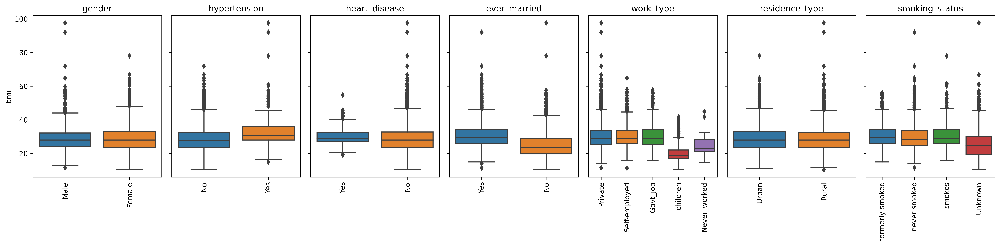

In [41]:
boxplot_cate('bmi')

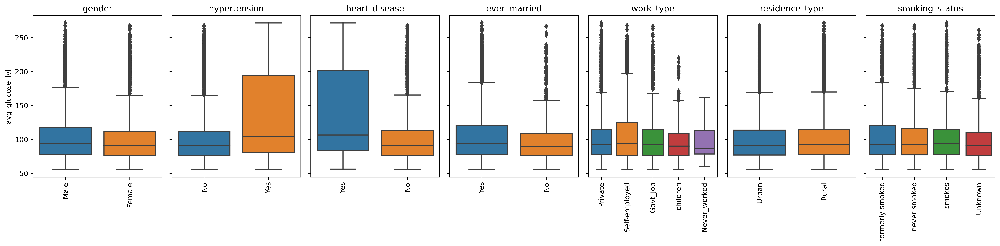

In [42]:
boxplot_cate('avg_glucose_lvl')

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 4.4 | Outliers Detection </div>

In [43]:
def find_outliers(df, dfName, num_cols):

    # Using the `for` loop to create new columns by identifying the outliers for each numeric variable
    n_rows=df.count()
    for column in num_cols:

        # Q1 : First Quartile ; Q3 : Third Quartile
        Q1 = df.approxQuantile(column, [0.25], relativeError = 0)
        Q3 = df.approxQuantile(column, [0.75], relativeError = 0)
        
        # IQR : Inter Quantile Range
        IQR = Q3[0] - Q1[0]
        
        # Managing outliers
        less_Q1 =  Q1[0] - 1.5*IQR
        more_Q3 =  Q3[0] + 1.5*IQR   
        df_out = df.filter((df[column] < less_Q1)| (df[column] > more_Q3))
        n_outliers = df_out.count()
        
        # Outliers will be deleted only if they do not exceed 3% of the total rows
        if n_outliers < n_rows *3/100: 
            df=df.filter((df[column] >= less_Q1) & (df[column] <= more_Q3))
            print(f'The outliers of  {column} have been deleted')
                  
        else:
            print(f'The outliers of {column} has to be managed later' )
        
    return df

In [44]:
df_cleaned = find_outliers(df1, 'df1', num_cols)


The outliers of  age have been deleted
The outliers of avg_glucose_lvl has to be managed later
The outliers of  bmi have been deleted


In [45]:
print(f'The Dataframe without outliers has now {df_cleaned.count()} observations')

The Dataframe without outliers has now 4985 observations


# <a id="5"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 5 <span style='color:#5ce1e6'>•</span> Data Pre-processing </b></a>

[Back to the top](#Index) ↑


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">5.1 | Indexing & Encoding Categorical Variables </div>

In [46]:
df_cleaned.show(10)

+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
|gender|age|hypertension|heart_disease|ever_married|    work_type|residence_type|avg_glucose_lvl| bmi| smoking_status|stroke|
+------+---+------------+-------------+------------+-------------+--------------+---------------+----+---------------+------+
|  Male| 67|          No|          Yes|         Yes|      Private|         Urban|         228.69|36.6|formerly smoked|   Yes|
|Female| 61|          No|           No|         Yes|Self-employed|         Rural|         202.21|28.0|   never smoked|   Yes|
|  Male| 80|          No|          Yes|         Yes|      Private|         Rural|         105.92|32.5|   never smoked|   Yes|
|Female| 49|          No|           No|         Yes|      Private|         Urban|         171.23|34.4|         smokes|   Yes|
|Female| 79|         Yes|           No|         Yes|Self-employed|         Rural|         174.12|24.0|   never smoked|

In [47]:

label = StringIndexer(inputCol = 'stroke', outputCol = 'stroke_indexed')

indexers = [StringIndexer(inputCol=c, 
                         outputCol="{0}_indexed".format(c)) 
           for c in cat_cols]

encoders = [OneHotEncoder(inputCol= idx.getOutputCol(),
                         outputCol="{0}_encoded".format(idx.getOutputCol()))
           for idx in indexers]


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">5.2 | Assembly & Scaling Quantitative Variables </div>

In [48]:
# robust scaler has been used for variables that still have outliers
robust_smblr = VectorAssembler(inputCols = ["avg_glucose_lvl"], outputCol = "featuresR")
min_max_smblr =  VectorAssembler(inputCols = ['age', 'bmi'], outputCol = "featuresMM")

In [49]:
scalerRobust = RobustScaler(inputCol = "featuresR", outputCol = "scaledFeaturesRobust")
scalerMinMax = MinMaxScaler(inputCol = "featuresMM", outputCol = "scaledFeaturesMinMax")

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">5.3 | Assembly Categorical & Quantitative Variables </div>

In [50]:
assembler_inputs = ([ecd.getOutputCol() for ecd in encoders] + 
                    ["scaledFeaturesRobust"]+["scaledFeaturesMinMax"])

#print(assembler_inputs)

assemblerAll = VectorAssembler(inputCols = assembler_inputs, outputCol = "features")

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">5.4 | Pipeline </div>

In [51]:
pipe = Pipeline(stages = [label] + indexers + encoders + 
                         [robust_smblr, min_max_smblr, scalerRobust, 
                          scalerMinMax, assemblerAll])

In [52]:
df_encodedScaled = pipe.fit(df_cleaned).transform(df_cleaned)

In [53]:
df_encodedScaled.printSchema()

root
 |-- gender: string (nullable = true)
 |-- age: integer (nullable = true)
 |-- hypertension: string (nullable = false)
 |-- heart_disease: string (nullable = false)
 |-- ever_married: string (nullable = true)
 |-- work_type: string (nullable = true)
 |-- residence_type: string (nullable = true)
 |-- avg_glucose_lvl: float (nullable = true)
 |-- bmi: float (nullable = false)
 |-- smoking_status: string (nullable = true)
 |-- stroke: string (nullable = false)
 |-- stroke_indexed: double (nullable = false)
 |-- gender_indexed: double (nullable = false)
 |-- hypertension_indexed: double (nullable = false)
 |-- heart_disease_indexed: double (nullable = false)
 |-- ever_married_indexed: double (nullable = false)
 |-- work_type_indexed: double (nullable = false)
 |-- residence_type_indexed: double (nullable = false)
 |-- smoking_status_indexed: double (nullable = false)
 |-- gender_indexed_encoded: vector (nullable = true)
 |-- hypertension_indexed_encoded: vector (nullable = true)
 |-- 

In [54]:
df_final = df_encodedScaled.select("features","stroke_indexed")

In [55]:
df_final.groupBy("stroke_indexed").count().sort('stroke_indexed')\
.show()

+--------------+-----+
|stroke_indexed|count|
+--------------+-----+
|           0.0| 4739|
|           1.0|  246|
+--------------+-----+



In [56]:
df_final.show(10, truncate = False)

+-----------------------------------------------------------------------------------------------------------+--------------+
|features                                                                                                   |stroke_indexed|
+-----------------------------------------------------------------------------------------------------------+--------------+
|(15,[1,3,4,8,11,12,13,14],[1.0,1.0,1.0,1.0,1.0,6.263764361799275,0.8170731707317074,0.730555527224952])    |1.0           |
|[1.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,5.538483624696423,0.7439024390243902,0.4916666743931949]  |1.0           |
|(15,[1,3,4,9,12,13,14],[1.0,1.0,1.0,1.0,2.901123366345985,0.975609756097561,0.6166666777045641])           |1.0           |
|[1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,4.689948548074387,0.5975609756097561,0.6694444992660018]  |1.0           |
|(15,[0,2,3,5,9,12,13,14],[1.0,1.0,1.0,1.0,1.0,4.7691049387746745,0.9634146341463415,0.38055556033864446])  |1.0           |


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">5.5 | Splitting the Dataset into Training & Testing data </div>

In [112]:
SPLIT_VALS = [.7, .3]

# split dataframes between 0s and 1s
zeros = df_final.filter(df_final["stroke_indexed"]== 0)
ones = df_final.filter(df_final["stroke_indexed"]== 1)
    # split dataframes into training and testing
train0, test0 = zeros.randomSplit(SPLIT_VALS, seed=9)
train1, test1 = ones.randomSplit(SPLIT_VALS, seed=9)
    # stack datasets back together
train = train0.union(train1)
test = test0.union(test1)
print('training set:', train.count())
print('test set:', test.count())

training set: 3501
test set: 1484


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;">5.6 | Oversampling </div>

In [59]:
major_df = train.filter(F.col("stroke_indexed") == 0)
minor_df = train.filter(F.col("stroke_indexed") == 1)
ratio = int(major_df.count()/minor_df.count())
print("ratio: {}".format(ratio))
# Oversampling
a = range(ratio)
# duplicate the minority rows
oversampling = minor_df.withColumn("dummy", explode(array([lit(x) for x in a]))).drop('dummy')
train = major_df.unionAll(oversampling)
train.count()

ratio: 18


6561

# <a id="6"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6 <span style='color:#5ce1e6'>•</span> Classification Models </b></a>

[Back to the top](#Index) ↑

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6.1 | Logistic Regression </div>

In [60]:
logr = LogisticRegression(featuresCol='features', 
                          labelCol='stroke_indexed')

In [61]:
model_LR = logr.fit(train)

In [62]:
predictions_LR = model_LR.transform(test)

In [63]:
predictions_LR.select("stroke_indexed", "prediction").orderBy(rand()).show(10, truncate=False)

+--------------+----------+
|stroke_indexed|prediction|
+--------------+----------+
|0.0           |0.0       |
|0.0           |1.0       |
|0.0           |0.0       |
|0.0           |1.0       |
|0.0           |0.0       |
|0.0           |0.0       |
|0.0           |0.0       |
|0.0           |0.0       |
|0.0           |0.0       |
|0.0           |0.0       |
+--------------+----------+
only showing top 10 rows



In [64]:
def classification_results(predictions_by_model):
    # important: need to cast to float type,
    # and order by prediction, else it won't work!!
    preds = predictions_by_model\
    .select(['prediction','stroke_indexed'])\
    .withColumn('label', F.col('stroke_indexed')\
    .cast(FloatType()))\
    .orderBy('prediction')

    #select only prediction and label columns
    preds_by_model = preds.select(['prediction','label'])

    metrics = MulticlassMetrics(preds_by_model.rdd.map(tuple))
    
    accuracy = metrics.accuracy
    precision = metrics.precision(1)
    recall = metrics.recall(1)
    accuracy_un = (recall+precision)/2
    f1 = metrics.fMeasure(1.0)
    
    print(f'Accuracy :  {accuracy}')
    print(f'Precision : {precision}')
    print(f'Recall :    {recall}')
    print(f'F1 :        {f1}')

In [65]:
def conf_matrix(predictions_by_model):
    y_true = predictions_by_model.select("stroke_indexed").collect()
    y_pred = predictions_by_model.select("prediction").collect()
    c_m = confusion_matrix(y_true, y_pred)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in
                c_m.flatten()]
    labels = [f"{v1}\n{v2}" for v1, v2 in
             zip(group_names, group_counts)]
    labels = np.asarray(labels).reshape(2,2)
    ax= plt.subplot()
    sns.heatmap(c_m, annot=labels, fmt='', ax=ax, cmap= 'Blues' );
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['No', 'Yes']); ax.yaxis.set_ticklabels(['No', 'Yes']);

In [66]:
print("Logistic Regression")
classification_results(predictions_LR)

Logistic Regression
Accuracy :  0.7540431266846361
Precision : 0.12531328320802004
Recall :    0.7575757575757576
F1 :        0.21505376344086022


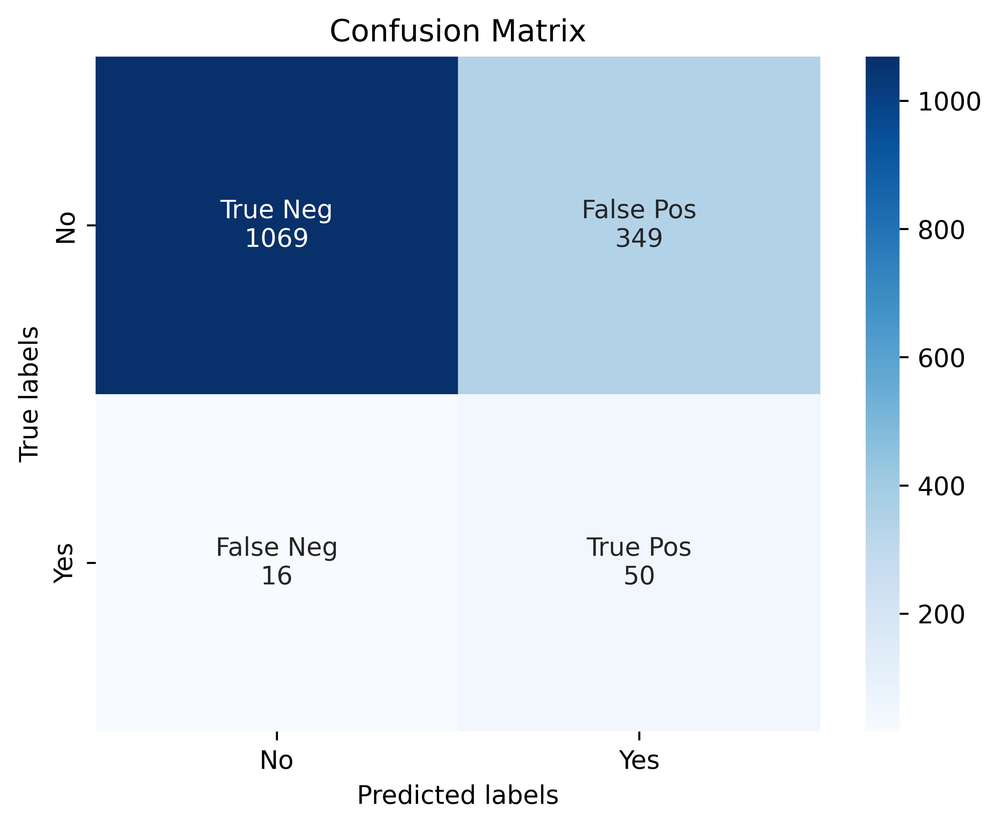

In [67]:
conf_matrix(predictions_LR)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6.2 | Decision Tree </div>

In [68]:
DT = DecisionTreeClassifier(featuresCol = 'features',
                            labelCol = 'stroke_indexed', 
                            maxDepth = 10)

In [69]:
model_DT = DT.fit(train)

In [70]:
predictions_DT = model_DT.transform(test)
predictions_DT.show(5)

+--------------------+--------------+-------------+--------------------+----------+
|            features|stroke_indexed|rawPrediction|         probability|prediction|
+--------------------+--------------+-------------+--------------------+----------+
|(15,[0,1,2,3,4,12...|           0.0|  [48.0,36.0]|[0.57142857142857...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|  [48.0,36.0]|[0.57142857142857...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|  [48.0,36.0]|[0.57142857142857...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|  [204.0,0.0]|           [1.0,0.0]|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|  [48.0,36.0]|[0.57142857142857...|       0.0|
+--------------------+--------------+-------------+--------------------+----------+
only showing top 5 rows



In [71]:
print("Decision Tree")
classification_results(predictions_DT)

Decision Tree
Accuracy :  0.8261455525606469
Precision : 0.10975609756097561
Recall :    0.4090909090909091
F1 :        0.17307692307692307


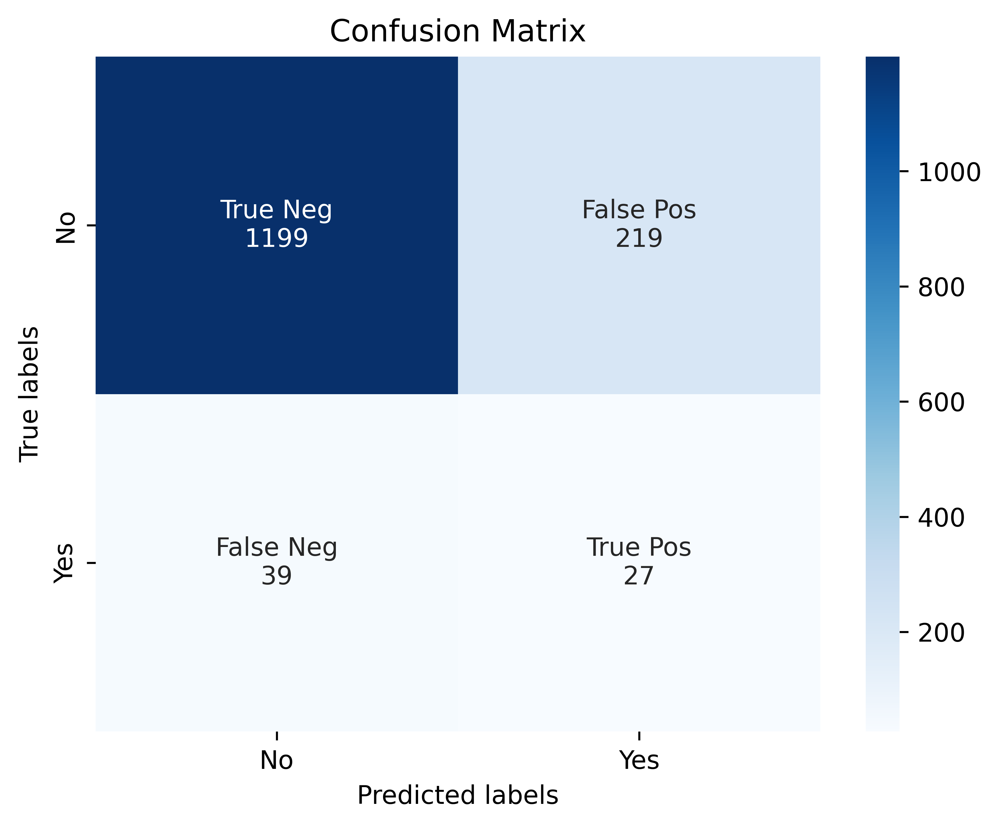

In [72]:
conf_matrix(predictions_DT)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6.3 | Random Forest </div>

In [73]:
Rf = RandomForestClassifier(numTrees=65, 
                            labelCol = 'stroke_indexed', 
                            featuresCol="features", 
                            maxDepth=10)

In [74]:
model_RF = Rf.fit(train)

In [75]:
predictions_RF = model_RF.transform(test)
predictions_RF.show(10)

+--------------------+--------------+--------------------+--------------------+----------+
|            features|stroke_indexed|       rawPrediction|         probability|prediction|
+--------------------+--------------+--------------------+--------------------+----------+
|(15,[0,1,2,3,4,12...|           0.0|[40.2936926851255...|[0.61990296438654...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[33.9349833449644...|[0.52207666684560...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[36.9531477409047...|[0.56850996524468...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[63.1466730145855...|[0.97148727714746...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[42.5369774750828...|[0.65441503807819...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[63.7590927723041...|[0.98090911957391...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[63.6227876642670...|[0.97881211791180...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[63.2764841623215...|[0.97348437172802...|       0.0|

In [76]:
print("Random Forest")
classification_results(predictions_RF)

Random Forest
Accuracy :  0.8847708894878706
Precision : 0.14285714285714285
Recall :    0.3181818181818182
F1 :        0.19718309859154928


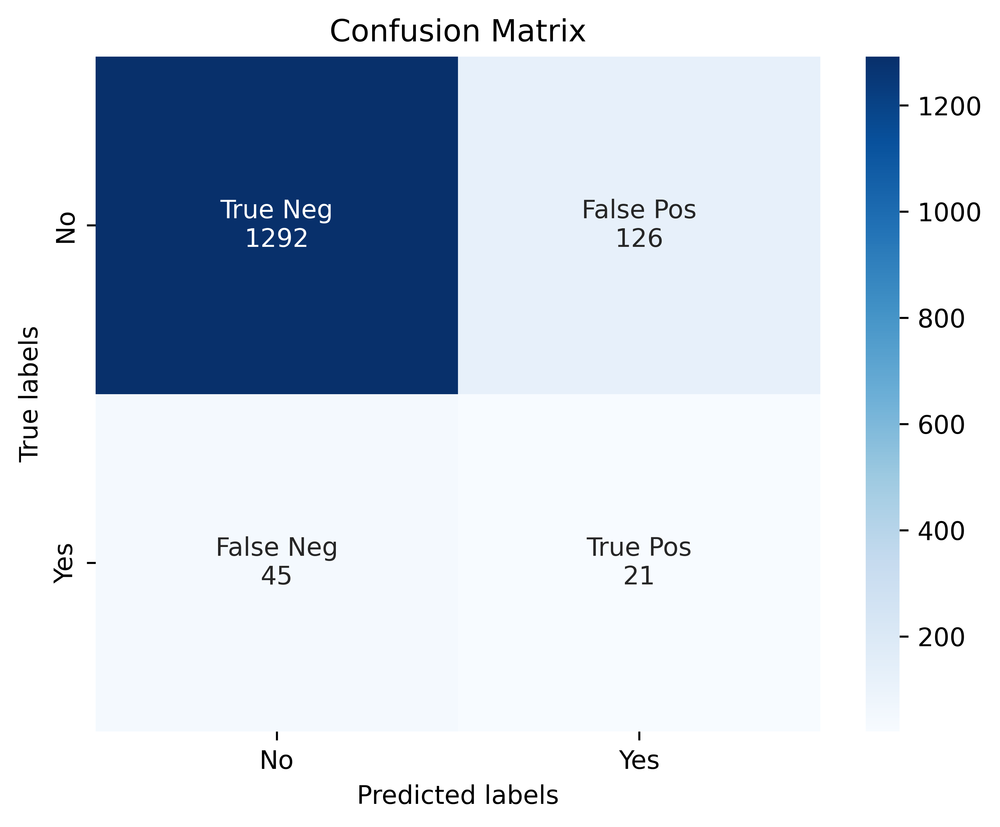

In [77]:
conf_matrix(predictions_RF)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6.4 | Naive Bayes </div>

In [78]:
NB = NaiveBayes(labelCol = 'stroke_indexed')

In [79]:
model_NB = NB.fit(train)

In [80]:
predictions_NB = model_NB.transform(test)

In [81]:
predictions_NB.show(5)

+--------------------+--------------+--------------------+--------------------+----------+
|            features|stroke_indexed|       rawPrediction|         probability|prediction|
+--------------------+--------------+--------------------+--------------------+----------+
|(15,[0,1,2,3,4,12...|           0.0|[-18.587323678877...|[0.53922442243386...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[-18.947648748244...|[0.53603894246495...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[-18.878955261258...|[0.53075649872775...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[-18.195173018170...|[0.54273766029061...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[-20.477662680900...|[0.52354550753078...|       0.0|
+--------------------+--------------+--------------------+--------------------+----------+
only showing top 5 rows



In [82]:
print("Naive Bayes")
classification_results(predictions_NB)

Naive Bayes
Accuracy :  0.6179245283018868
Precision : 0.08180300500834725
Recall :    0.7424242424242424
F1 :        0.1473684210526316


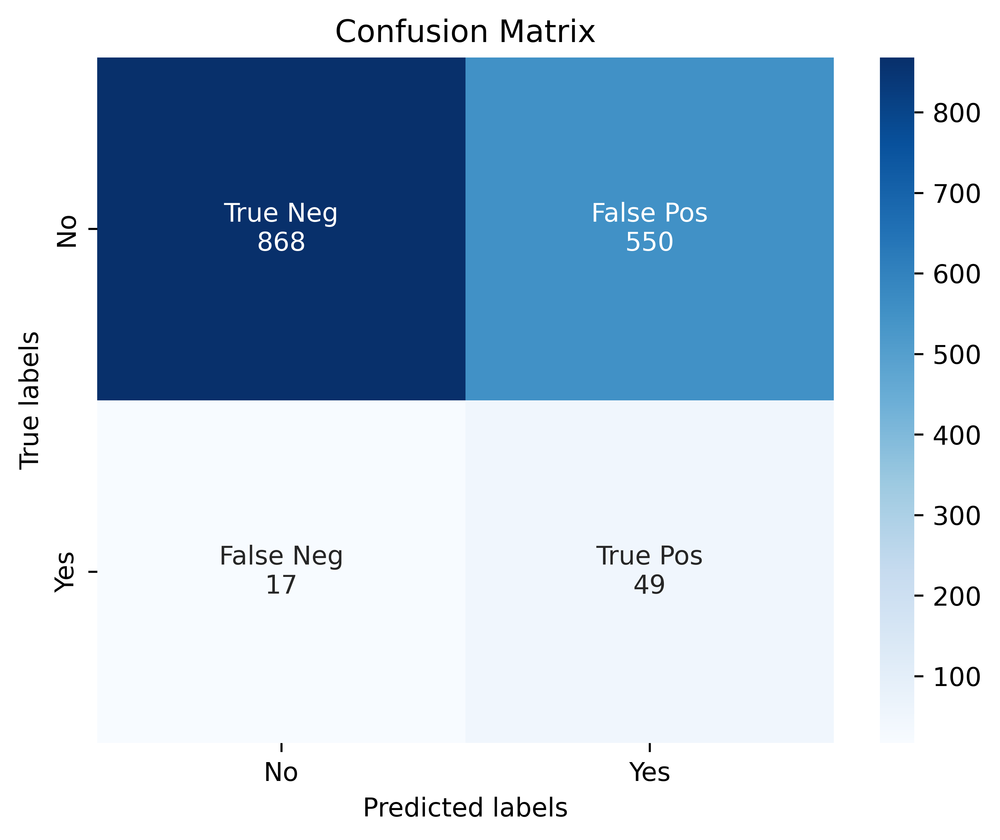

In [83]:
conf_matrix(predictions_NB)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6.5 | Gradient Boosted Tree </div>

In [84]:
gbt = GBTClassifier(labelCol='stroke_indexed',featuresCol="features")

In [85]:
model_GBT = gbt.fit(train)

In [86]:
predictions_GBT = model_GBT.transform(test)

In [87]:
predictions_GBT.show(5)

+--------------------+--------------+--------------------+--------------------+----------+
|            features|stroke_indexed|       rawPrediction|         probability|prediction|
+--------------------+--------------+--------------------+--------------------+----------+
|(15,[0,1,2,3,4,12...|           0.0|[0.14711347764691...|[0.57303064520480...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[-0.1431155246484...|[0.42892681795258...|       1.0|
|(15,[0,1,2,3,4,12...|           0.0|[0.14711347764691...|[0.57303064520480...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[1.47801579101111...|[0.95054778488730...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[0.27644346627912...|[0.63480512169544...|       0.0|
+--------------------+--------------+--------------------+--------------------+----------+
only showing top 5 rows



In [88]:
print("Gradient Boosted Tree")
classification_results(predictions_GBT)

Gradient Boosted Tree
Accuracy :  0.8025606469002695
Precision : 0.13029315960912052
Recall :    0.6060606060606061
F1 :        0.21447721179624665


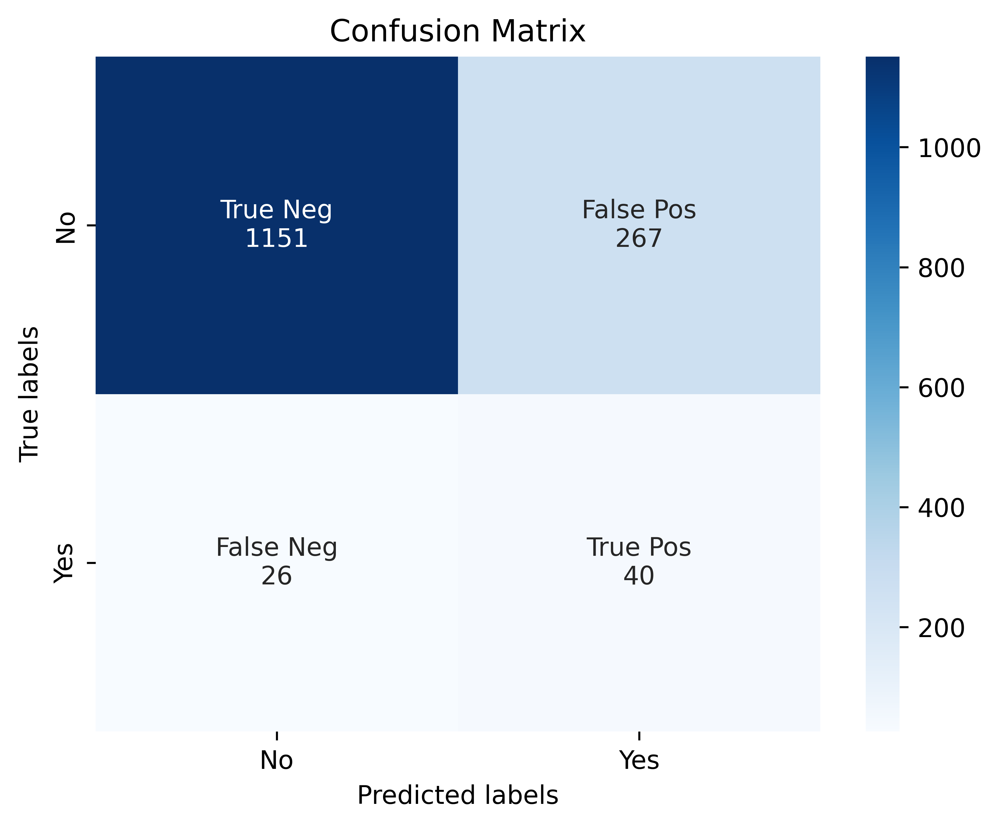

In [89]:
conf_matrix(predictions_GBT)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 6.6 | Super Vector Machines </div>

In [90]:
lsvc = LinearSVC(labelCol="stroke_indexed", maxIter=50)
model_lsvc = lsvc.fit(train)

predictions_lsvc = model_lsvc.transform(test)
predictions_lsvc.show(5)

+--------------------+--------------+--------------------+----------+
|            features|stroke_indexed|       rawPrediction|prediction|
+--------------------+--------------+--------------------+----------+
|(15,[0,1,2,3,4,12...|           0.0|[0.66434776249315...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[0.61204625044318...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[0.39769379732263...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[1.29621124211007...|       0.0|
|(15,[0,1,2,3,4,12...|           0.0|[0.06476591511774...|       0.0|
+--------------------+--------------+--------------------+----------+
only showing top 5 rows



In [91]:
print("Super Vector Machines")
classification_results(predictions_lsvc)

Super Vector Machines
Accuracy :  0.7338274932614556
Precision : 0.11655011655011654
Recall :    0.7575757575757576
F1 :        0.20202020202020202


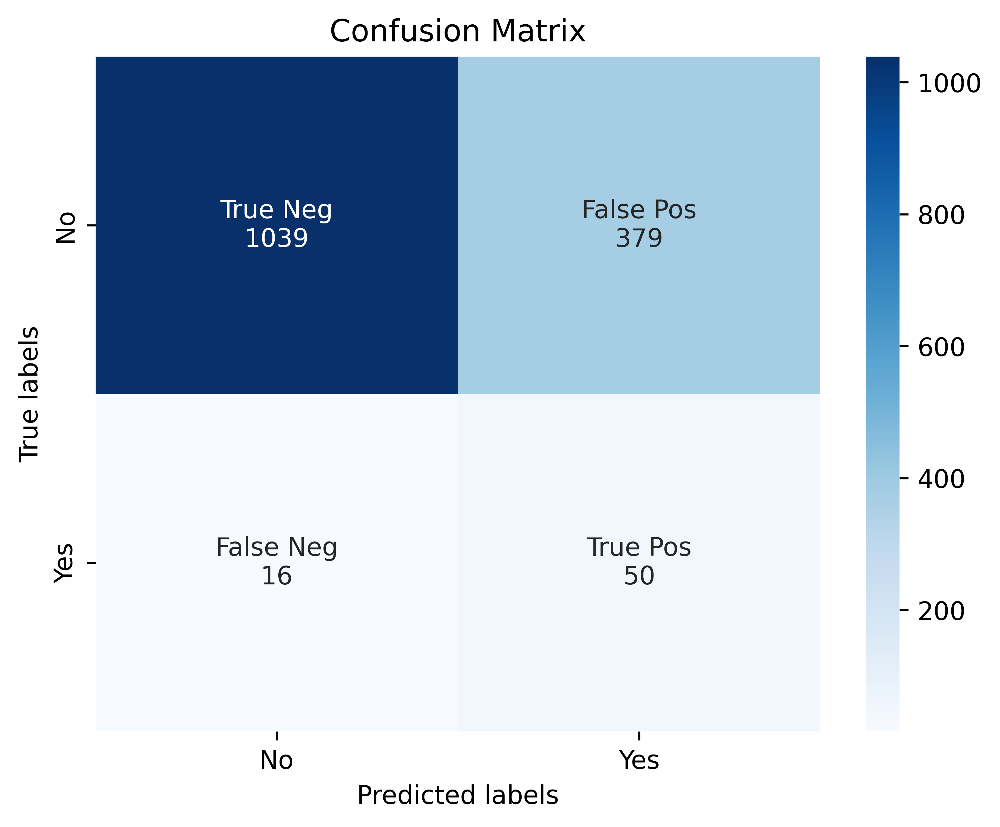

In [92]:
conf_matrix(predictions_lsvc)

# <a id="7"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 7 <span style='color:#5ce1e6'>•</span> Variable Selection (Chisq) + Class Weight </b></a>

[Back to the top](#Index) ↑

In [93]:
# #chisq doesn't work with one hot encoding so i will use indexed features
assembler_inputs = ([idx.getOutputCol() for idx in indexers] + 
                    ["scaledFeaturesRobust"]+["scaledFeaturesMinMax"])

print(assembler_inputs)

assemblerAll = VectorAssembler(inputCols = assembler_inputs, outputCol = "features")


['gender_indexed', 'hypertension_indexed', 'heart_disease_indexed', 'ever_married_indexed', 'work_type_indexed', 'residence_type_indexed', 'smoking_status_indexed', 'scaledFeaturesRobust', 'scaledFeaturesMinMax']


In [94]:
pipe_n = Pipeline(stages = [label] + indexers + 
                         [robust_smblr, min_max_smblr, scalerRobust, 
                          scalerMinMax, assemblerAll])

df_scaled = pipe_n.fit(df_cleaned).transform(df_cleaned)

df_final_s = df_scaled.select("features","stroke_indexed")

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 7.1 | Best Features Selection </div>

In [95]:
selector=ChiSqSelector(numTopFeatures= 11,
                       fpr = 0.05,
                       featuresCol="features",
                       outputCol="selectFeatures",
                       labelCol= "stroke_indexed")

df_final_s = selector.fit(df_final_s).transform(df_final_s)

In [96]:
df_final_s = df_final_s.drop("features")
df_final_s = df_final_s.withColumnRenamed("selectFeatures", "features")

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 7.2 | Weightinh Classes </div>

In [97]:
class_count_df_final = df_final_s.groupby('stroke_indexed').agg({'stroke_indexed': 'count'})
n_1 = class_count_df_final.filter(df_final_s.stroke_indexed == '1') \
    .select("count(stroke_indexed)").collect()[0][0]
n_0 = class_count_df_final.filter(df_final_s.stroke_indexed == '0') \
    .select("count(stroke_indexed)").collect()[0][0]

w_1 = (n_0 + n_1) / (2 * n_1)
w_0 = (n_0 + n_1) / (2 * n_0)

class_weights = {0: w_0, 1: w_1}

mapping_expr = create_map([lit(x) for x in chain(*class_weights.items())])
df_w = df_final_s.withColumn("weights", mapping_expr.getItem(F.col("stroke_indexed")))

trainS, testS = df_w.randomSplit([0.7, 0.3], seed=9)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 7.1 | Balanced Logistic Regression </div>

Logistic Regression
Accuracy :  0.7454545454545455
Precision : 0.13411764705882354
Recall :    0.8507462686567164
F1 :        0.23170731707317074


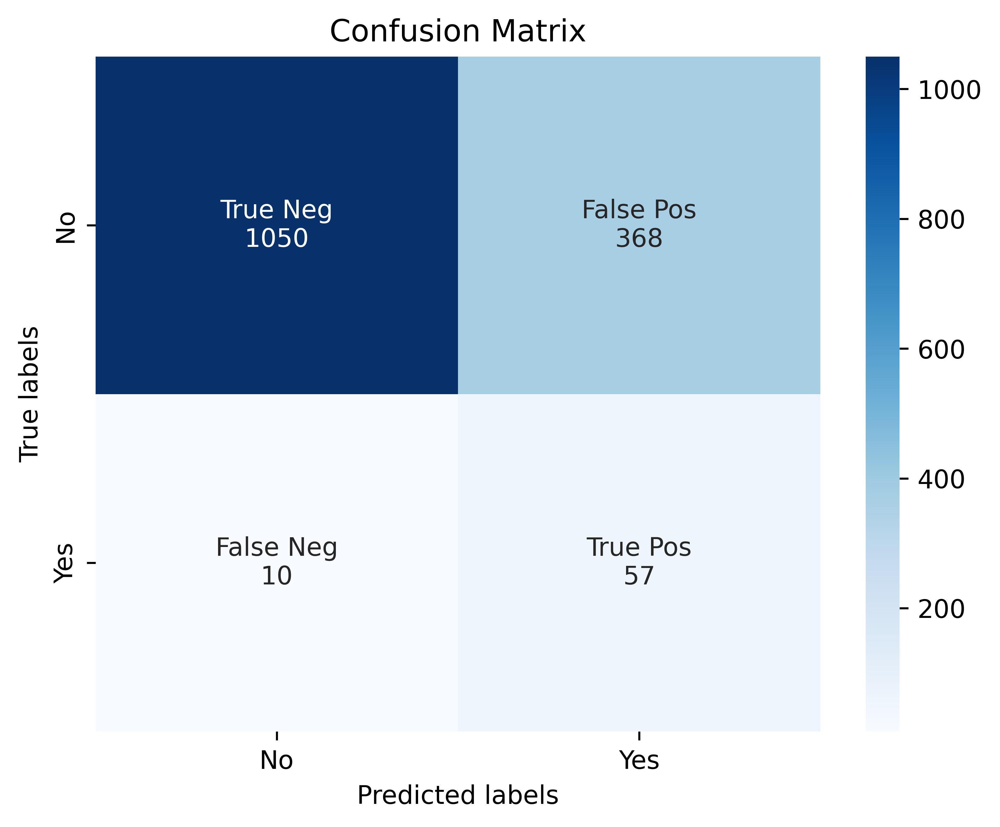

In [98]:
# #added weightCol param for the target class

logr_w = LogisticRegression(featuresCol='features', 
                          labelCol='stroke_indexed', 
                          weightCol= "weights")

model_LR_W = logr_w.fit(trainS)

predictions_LR_W = model_LR_W.transform(testS)

print("Logistic Regression")
classification_results(predictions_LR_W)
conf_matrix(predictions_LR_W)


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 7.2 | Balanced Random Forest </div>

Random Forest
Accuracy :  0.773063973063973
Precision : 0.14473684210526316
Recall :    0.8208955223880597
F1 :        0.24608501118568232


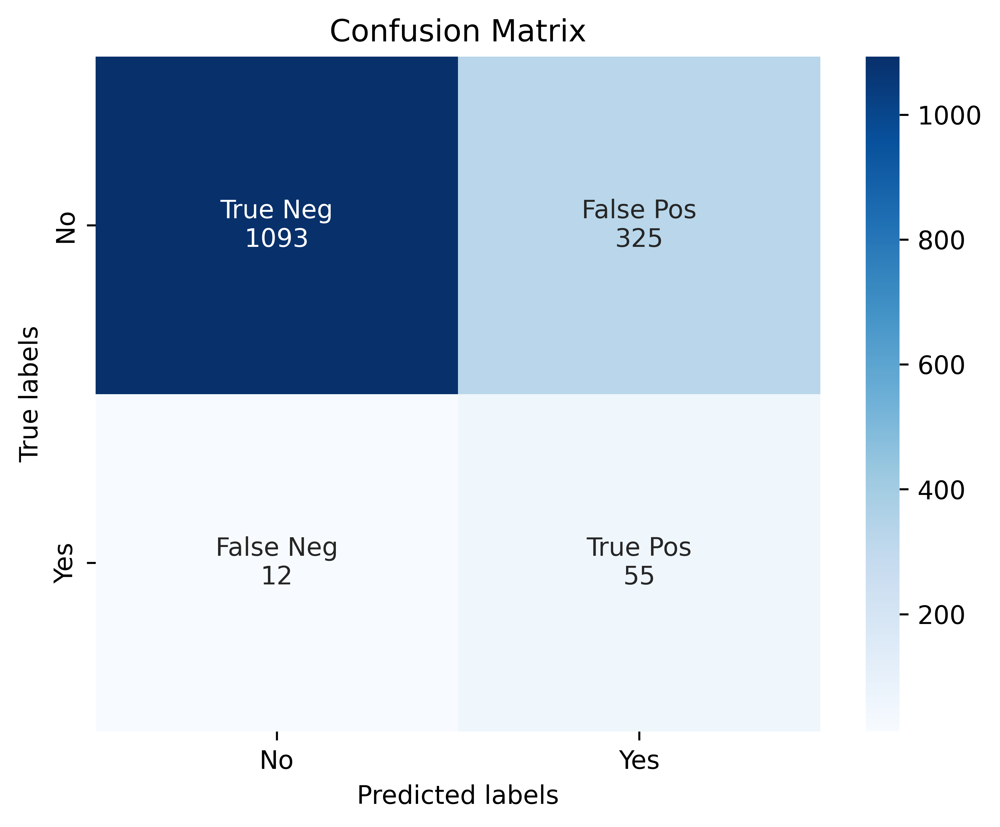

In [99]:
Rf_w = RandomForestClassifier(numTrees=1000, 
                            labelCol = 'stroke_indexed', 
                            featuresCol="features", 
                            maxDepth=5,
                            weightCol= "weights")

model_RF_W = Rf_w.fit(trainS)
predictions_RF_W = model_RF_W.transform(testS)

print("Random Forest")
classification_results(predictions_RF_W)
conf_matrix(predictions_RF_W)

# <a id="8"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 8 <span style='color:#5ce1e6'>•</span> Ensemble ML with Scikit Learn </b></a>

[Back to the top](#Index) ↑

In [100]:
# Scikit-Learn Ensemble Libraries

import sklearn
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.metrics import accuracy_score, precision_recall_curve
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.datasets import make_classification


In [101]:
df_s = df_cleaned.toPandas()

In [102]:
df_s['stroke'].replace(['No', 'Yes'],[0, 1], inplace=True)
df_s['hypertension'].replace(['No', 'Yes'],[0, 1], inplace=True)
df_s['heart_disease'].replace(['No', 'Yes'],[0, 1], inplace=True)

In [103]:
df_s["residence_type"] = df_s["residence_type"].apply(lambda x: 1 if x=="Urban" else 0)
df_s["ever_married"] = df_s["ever_married"].apply(lambda x: 1 if x=="Yes" else 0)
df_s["gender"] = df_s["gender"].apply(lambda x: 1 if x=="Male" else 0)

df_s = pd.get_dummies(data=df_s, columns=['smoking_status'])
df_s = pd.get_dummies(data=df_s, columns=['work_type'])

In [104]:
mm_scaler = MinMaxScaler()
columns = ['avg_glucose_lvl','bmi','age']
mm_scaled = mm_scaler.fit_transform(df_s[['avg_glucose_lvl','bmi','age']])

scaled = pd.DataFrame(mm_scaled,columns=columns)
df_s=df_s.drop(columns=columns,axis=1)


In [105]:
df_s = df_s.merge(scaled, left_index=True, right_index=True, how = "left")
df_s

,gender,hypertension,heart_disease,ever_married,residence_type,stroke,smoking_status_Unknown,smoking_status_formerly smoked,smoking_status_never smoked,smoking_status_smokes,work_type_Govt_job,work_type_Never_worked,work_type_Private,work_type_Self-employed,work_type_children,avg_glucose_lvl,bmi,age
0,1,0,1,1,1,1,0,1,0,0,0,0,1,0,0,0.801265,0.730556,0.817073
1,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0.679023,0.491667,0.743902
2,1,0,1,1,0,1,0,0,1,0,0,0,1,0,0,0.234512,0.616667,0.975610
3,0,0,0,1,1,1,0,0,0,1,0,0,1,0,0,0.536008,0.669444,0.597561
4,0,1,0,1,0,1,0,0,1,0,0,0,0,1,0,0.549349,0.380556,0.963415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4980,0,1,0,1,1,0,0,0,1,0,0,0,1,0,0,0.132167,0.491667,0.975610
4981,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0.323516,0.825000,0.987805
4982,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0.128658,0.563889,0.426829
4983,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0.513203,0.425000,0.621951


In [106]:
X = df_s.drop(['stroke'], axis=1)
y = df_s['stroke']

In [107]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= .3, random_state=9)

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 8.1 | Bagging Ensemble (Bootstrap Aggregation)</div>

In [108]:
bag = BaggingClassifier(n_estimators=10,oob_score=True) 
bag = bag.fit(X_train,y_train)
# evaluate the model
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=9)
n_scores = cross_val_score(bag, X, y, scoring='precision', cv=cv, n_jobs=-1, error_score='raise')
# report performance
print('precision: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

precision: 0.164 (0.204)


### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 8.1 | Bagging + Hypertuning (trees number) </div>

>10 0.213 (0.283)
>50 0.236 (0.304)
>100 0.261 (0.282)
>200 0.216 (0.250)
>500 0.277 (0.319)


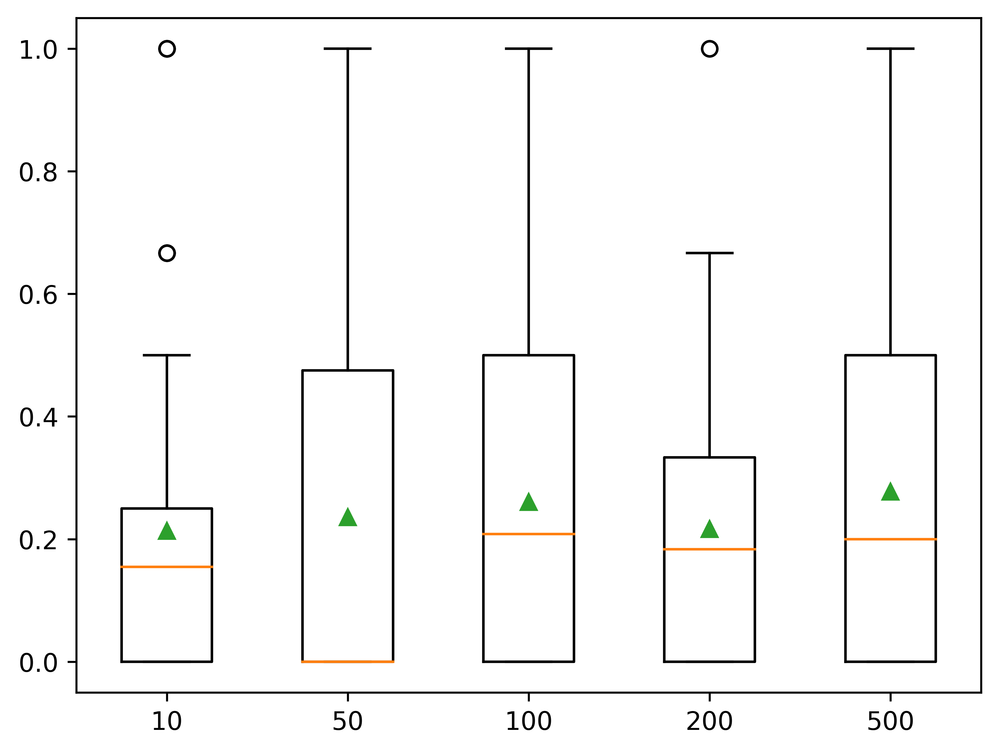

In [109]:

# get a list of models to evaluate
def get_models():
    models = dict()
    # define number of  decision trees to consider (hyperparameters)
    n_trees = [10, 50, 100, 200, 500]
    for n in n_trees:
        models[str(n)] = BaggingClassifier(n_estimators=n)
    return models

# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    # define the evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=9)
    # evaluate the model and collect the results
    scores = cross_val_score(model, X, y, scoring= 'precision', cv=cv, n_jobs=-1)
    return scores

# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    # evaluate the model
    scores = evaluate_model(model, X, y)
    # store the results
    results.append(scores)
    names.append(name)
    # summarize the performance along the way
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
plt.boxplot(results, labels=names, showmeans=True)
plt.show()

### <div style="font-family: Trebuchet MS; background-color: #115472; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 8.1 | Boosting Ensemble (Stochastic Gradient Boosting) </div>

In [110]:
from sklearn.ensemble import GradientBoostingClassifier
seed = 9
num_trees = 100
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=9)
model_gb = GradientBoostingClassifier(n_estimators=num_trees, random_state=seed)
results = cross_val_score(model_gb, X, y, scoring='precision', cv=cv)
print(results.mean())

0.23166666666666666


# <a id="7"><b><div style="font-family: Trebuchet MS; background-color: #0d628c; color: #FFFFFF; padding: 12px; line-height: 1.5;"> 10 <span style='color:#5ce1e6'>•</span> Close Spark Session </b></a>

[Back to the top](#Index) ↑

In [111]:
#spark.stop()